In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *

In [2]:
# def gaussian_filter(x, y, mu, cov):
    
#     dst = torch.dstack([torch.tensor(x.ravel()), torch.tensor(y.ravel())]).float().squeeze() - mu
 
#     # lower normal part of gaussian
#     normal = 1/(2 * torch.pi * torch.norm(cov))**(0.5)
    
#     print((torch.exp(-0.5*dst@torch.linalg.inv(cov))).shape, dst.T.shape)
#     # Calculating Gaussian filter
#     gauss = -0.5*dst@torch.linalg.inv(cov)
#     gauss2 = []
#     for i in range(gauss.shape[0]):
#         gauss2.append(gauss[i, :]@dst.T[:, i])

    
#     return (torch.exp(torch.tensor(gauss2))/normal).reshape(x.shape)

In [3]:
# mu = torch.tensor([0, -0.3])
# cov = torch.tensor([[1., 1.], 
#                     [1, 2]])

# plt.imshow(gaussian_filter(X, Y, mu, cov).detach().T)
# plt.colorbar()
# plt.grid()

In [4]:
def gaus2d(x=0, y=0, mx=0, my=0, sx=1, sy=1):
    return 1. / (2. * torch.pi * sx * sy) * torch.exp(-((x - mx)**2. / (2. * sx**2.) + (y - my)**2. / (2. * sy**2.)))

In [31]:
model = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T

wave_amp_coef = torch.tensor([30, 0., 0., 3, 3], requires_grad=True)

# coeffs = torch.rand(10, 1, requires_grad=True)
coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
# coeffs = torch.tensor([[ -13.53],
#         [-113.3250],
#         [ -12.7425],
#         [   4.4154],
#         [   6.2158],
#         [ -119.261],
#         [   2.3329],
#         [  1.3617],
#         [   1.5364],
#         [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(145.003) # mm 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': wave_amp_coef, 'lr': 1e-2},
    {'params': coeffs, 'lr': 10},
    {'params': cons, 'lr': 1e-2},
    # {'params': dist, 'lr': 1e-2}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

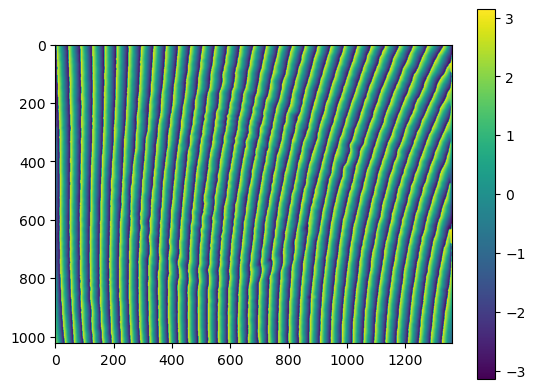

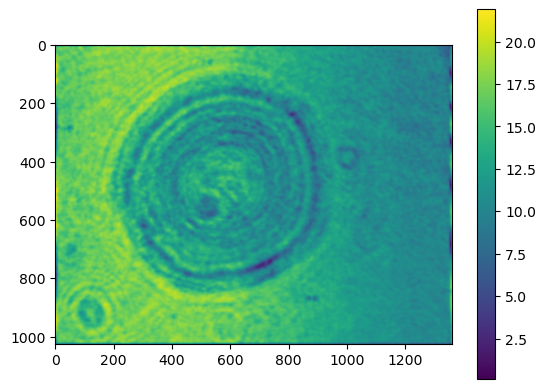

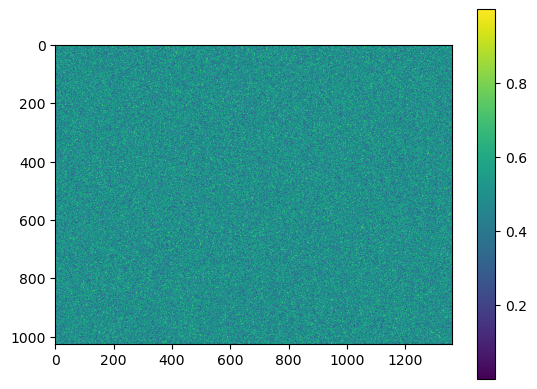

In [32]:
plt.imshow(target_phase.T)
plt.colorbar()
plt.show()

plt.imshow(target_abs.T)
plt.colorbar()
plt.show()

plt.imshow(obj_phase.detach())
plt.colorbar()
plt.show()

In [33]:
# obj_amp.shape, obj_phase.shape, wave.shape, wave_at_img.shape, target_abs.shape

0 0.2711205328363483


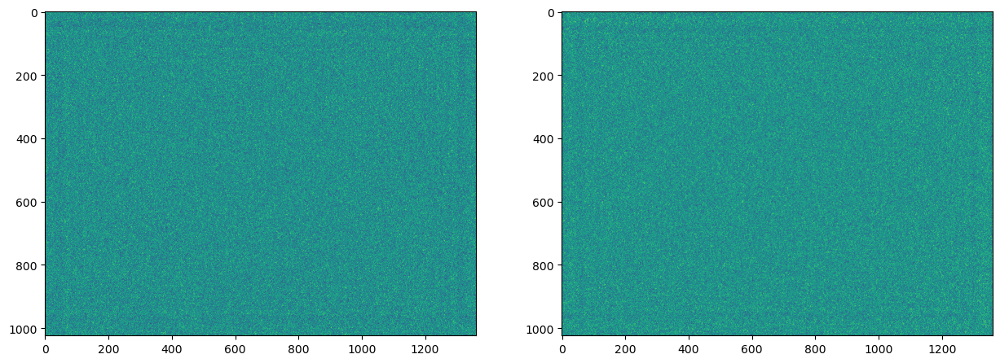

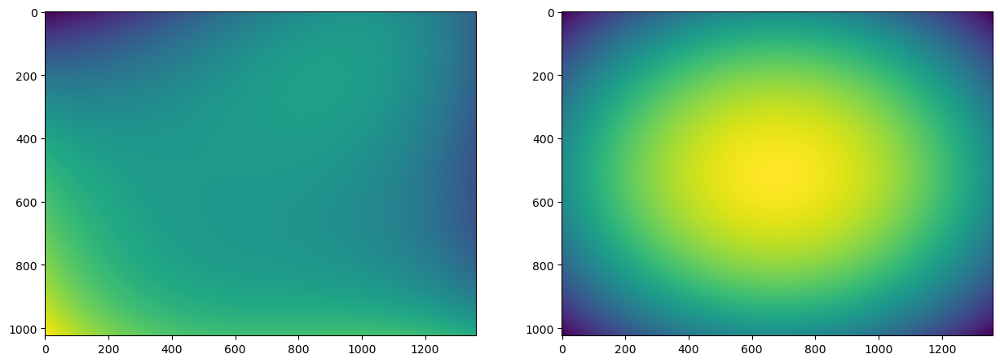

1 0.2059879381722828
2 0.17902841434092837
3 0.1749147228604596
4 0.17268775047225163
5 0.16719169454741967
6 0.16050045379529282
7 0.15354529245156479
8 0.14642529282372285
9 0.14064825645989396
10 0.13634605314632092
11 0.13278121378512966
12 0.12915803040163792
13 0.1270458765068881
14 0.12438527129124302
15 0.12217457462588574
16 0.12014671064769615
17 0.11913279371294686
18 0.11684446086889982
19 0.11477958060108848
20 0.11459261605110646
21 0.11294586713538024
22 0.11183127332217042
23 0.11060631452358398
24 0.10879148392698963
25 0.10707619763870126
26 0.10584304481244641
27 0.10776170892519454
28 0.10529773527223366
29 0.10508698408627674
30 0.10275927646944755
31 0.10409836555091406
32 0.10155633353605449
33 0.10100966172539433
34 0.1004033191489446
35 0.10046150906581401
36 0.10033313382447306
37 0.09885842892458248
38 0.09853662046041098
39 0.09807609990009097
40 0.09686109810194646
41 0.09612716526436357
42 0.09494953179670444
43 0.09832446740385418
44 0.09464332872141035
4

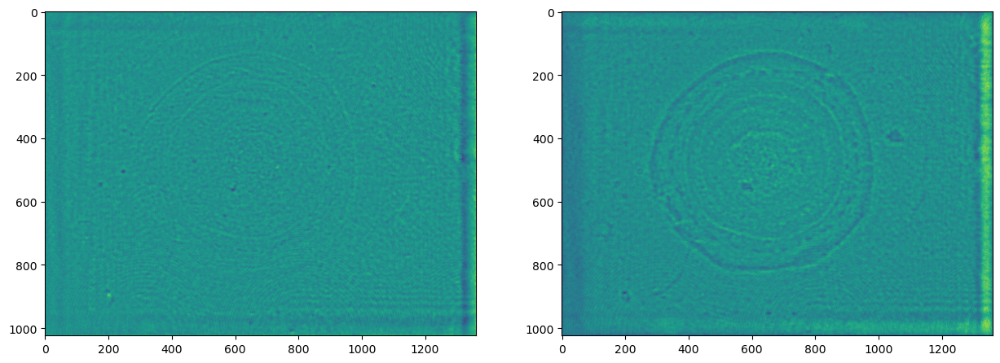

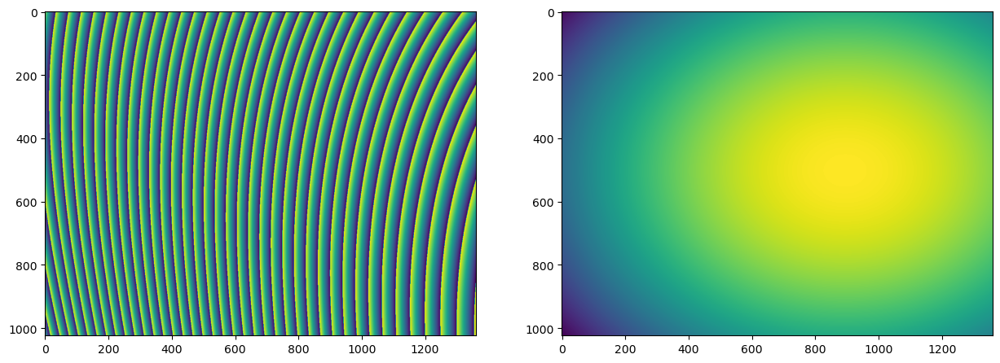

51 0.09133873657785566
52 0.09366264469620295
53 0.09095150033827235
54 0.09067038289972609
55 0.09128768944859293
56 0.09090381351057829
57 0.088603069505548
58 0.09048056646059248
59 0.08773604991954582
60 0.0923727711587436
61 0.08809122987987383
62 0.09105743563844661
63 0.08825072362687572
64 0.08835008097883709
65 0.08693105193732503
66 0.0867320220907003
67 0.08684243755556162
68 0.0863761630336804
69 0.08891645022000948
70 0.08545563550235671
71 0.08664629516472301
72 0.08526823336592765
73 0.08456002131066555
74 0.08581228100502791
75 0.08412502493933893
76 0.08523110415741389
77 0.08270513448951708
78 0.08483728657084338
79 0.08130659134849576
80 0.0845315771753555
81 0.08063797103242003
82 0.08381194876631214
83 0.08008826425057519
84 0.08210601227094266
85 0.080525312592256
86 0.0840611231240895
87 0.08301817917729559
88 0.08047545738083114
89 0.07803554832301522
90 0.07760720562182827
91 0.08119983421426642
92 0.08195051960982551
93 0.07661883322072842
94 0.076239099530562

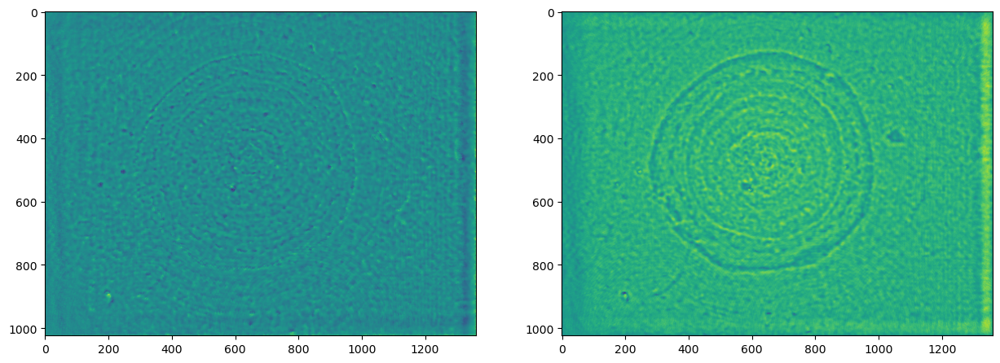

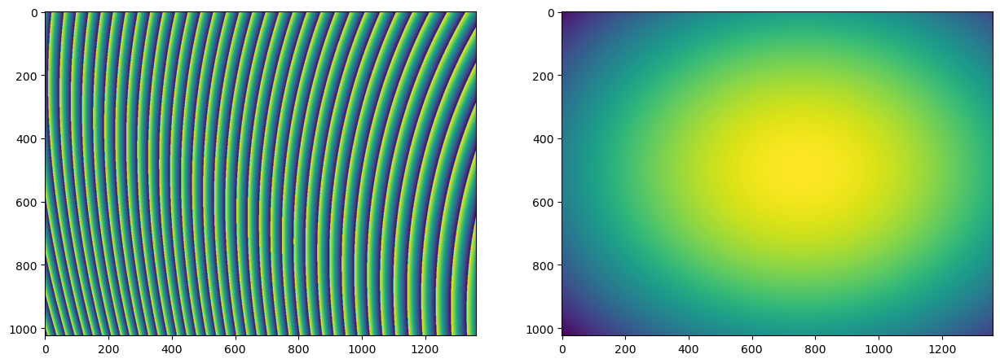

101 0.07475647876032424
102 0.07267348047269763
103 0.07205403280018935
104 0.07644224530076857
105 0.07325065674538218
106 0.07198701163755537
107 0.07559373312315978
108 0.07384839079739358
109 0.07580502236079403
110 0.07046994525830487
111 0.06863599210897284
112 0.07100151859473691
113 0.07572965557416524
114 0.07113343640975914
115 0.06828974582587581
116 0.06918178120446124
117 0.07134549366096153
118 0.07079146679112419
119 0.06828588460013409
120 0.06698726341497482
121 0.06779170053400319
122 0.06923417057922143
123 0.06849648049206332
124 0.06526471482716303
125 0.06479695086801
126 0.06778902716986651
127 0.06701201896138353
128 0.06615749739161125
129 0.0648272368923187
130 0.06349965900104108
131 0.06333898479889338
132 0.06596757895823499
133 0.06579158139311034
134 0.06264312637018538
135 0.06360525153722094
136 0.06524358086849821
137 0.0621850793329997
138 0.05989231974237775
139 0.06208496189697595
140 0.06499326102075623
141 0.06129754458658733
142 0.062432946681110

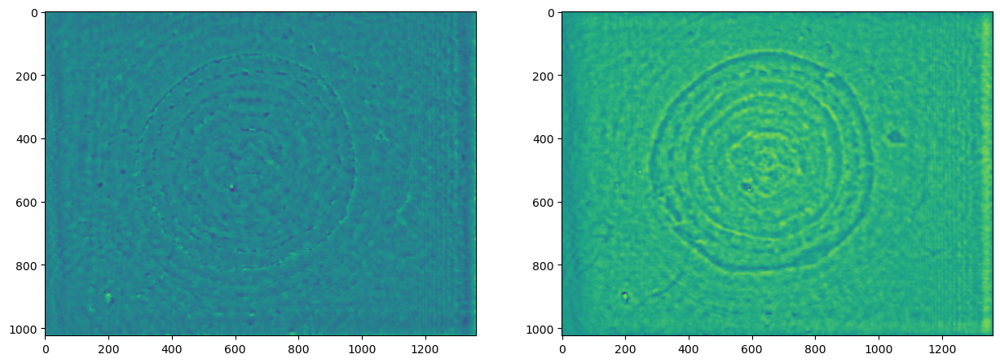

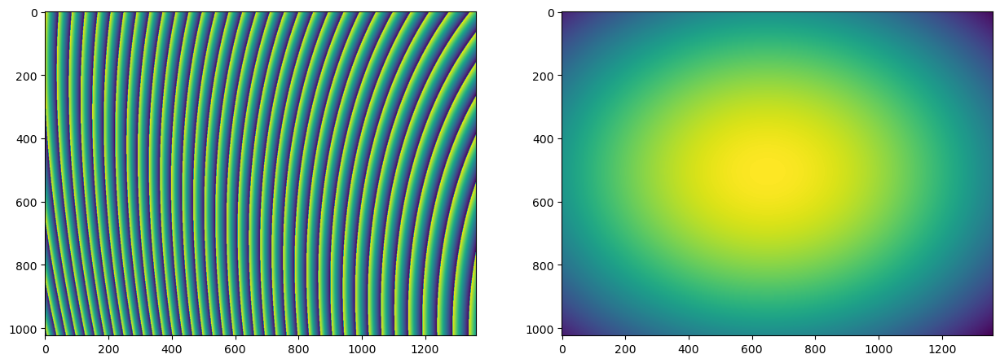

151 0.062259644326467044
152 0.059227324461365805
153 0.05847637764659694
154 0.0586199699753827
155 0.057470742504884265
156 0.05632179047375139
157 0.05835856809216443
158 0.06239561785242347
159 0.057512151603704015
160 0.055065063562804
161 0.05644215732788238
162 0.05693457999407427
163 0.05597718064386797
164 0.055380533133348266
165 0.05693073106718591
166 0.058384137884385144
167 0.06003093812949235
168 0.055058898749197976
169 0.05448560828868885
170 0.057860117915053286
171 0.055410335409882674
172 0.053437208146954976
173 0.0541516495397443
174 0.0550117475254572
175 0.05555401743367771
176 0.057154252012013324
177 0.05982866990441993
178 0.05793333405852848
179 0.05359894932044022
180 0.05152223709902231
181 0.052288506888529526
182 0.05722543959847928
183 0.05887939874036684
184 0.05293697667981152
185 0.050745622022176244
186 0.05432626878035763
187 0.05694585937707171
188 0.054062312913201904
189 0.05279714850501914
190 0.05453406662760428
191 0.0550254242486541
192 0.05

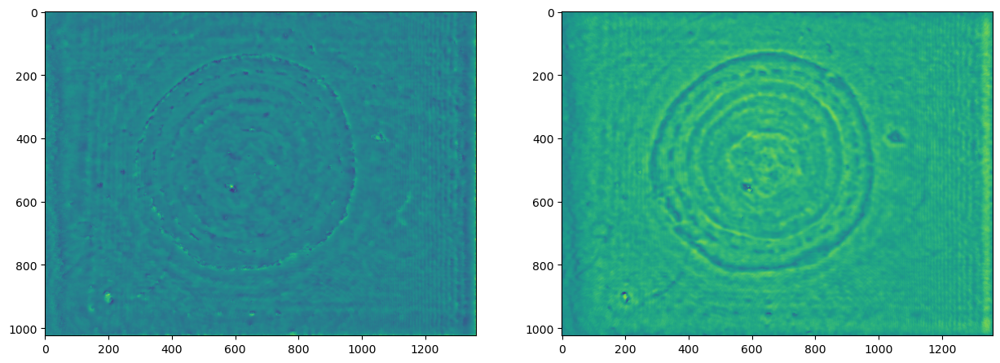

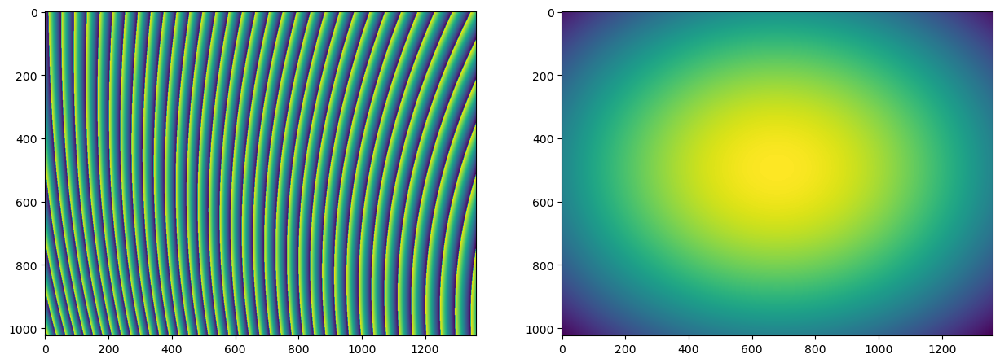

201 0.056176116357447375
202 0.05268157054869003
203 0.05145401406986486
204 0.05189021586609112
205 0.052796243834415724
206 0.05464409994699783
207 0.05527945051325667
208 0.050339012280298634
209 0.0512901235983485
210 0.05470364722726951
211 0.0547029627351434
212 0.05199672438870434
213 0.05005437922462771
214 0.05024667902487334
215 0.05403133205560992
216 0.05401354518578152
217 0.05126974641711102
218 0.049417961557729234
219 0.05055091563183367
220 0.05217161311726952
221 0.052367043683654975
222 0.051365856685626335
223 0.051561948196482285
224 0.05447032613705103
225 0.049871730031978034
226 0.048520759807681293
227 0.051064776175705
228 0.05210301363798732
229 0.052407000091083324
230 0.0499409660756362
231 0.049838032965304105
232 0.05044045140291082
233 0.04991806637020043
234 0.05012730046695778
235 0.0515987786885614
236 0.05111652689238175
237 0.05034277554282035
238 0.049876327186958044
239 0.05019582722166409
240 0.05030916447464416
241 0.04978495347841676
242 0.0487

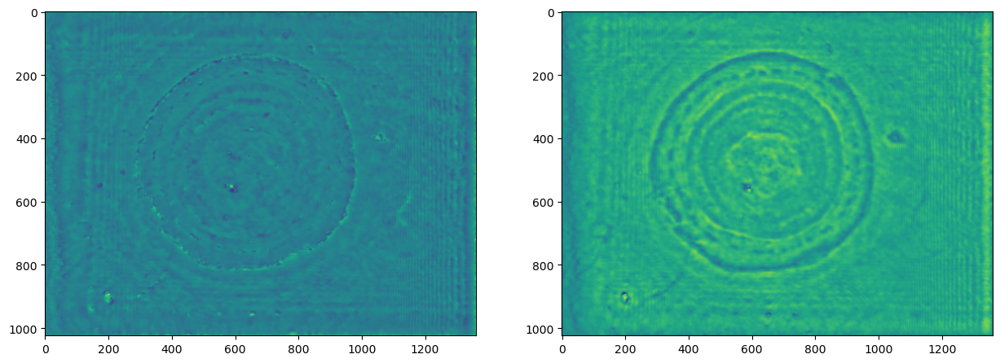

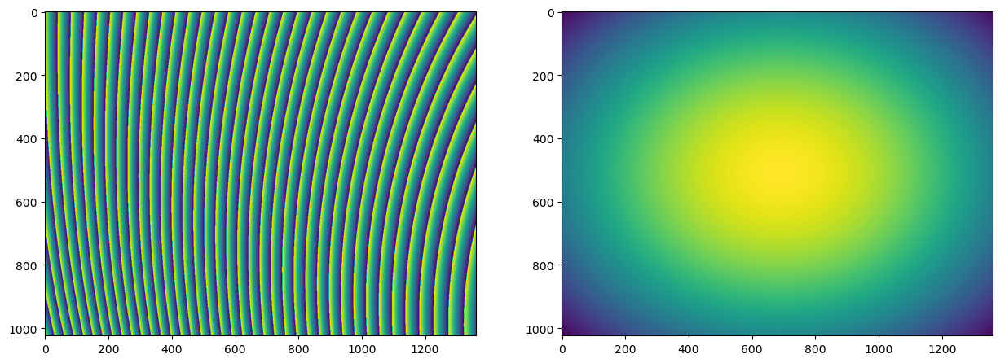

251 0.053233163222888735
252 0.05020297019417924
253 0.0499382763790502
254 0.04972539855065238
255 0.04720578664093231
256 0.049107628244276294
257 0.05181191891869409
258 0.05127029784050343
259 0.050024149875510154
260 0.04802931200567354
261 0.047387093880690415
262 0.049030023117317606
263 0.04936296940294436
264 0.04745653413641648
265 0.05010304601257218
266 0.051050696504440954
267 0.05075506206338798
268 0.04743212253086157
269 0.046532724985681166
270 0.048477613765780664
271 0.05049256441072775
272 0.04937530434842226
273 0.047517514800359595
274 0.04724882134473561
275 0.04887327429403303
276 0.049729062302880545
277 0.05088518592935022
278 0.05058482677521771
279 0.04958836935157397
280 0.04730343503142334
281 0.04548560513597863
282 0.04587730807829138
283 0.04856822645322901
284 0.05320805681565666
285 0.04938335251792674
286 0.04560070098210506
287 0.04612149978680932
288 0.04997524623800943
289 0.052168439083918744
290 0.047369609613182914
291 0.04601159486197195
292 0

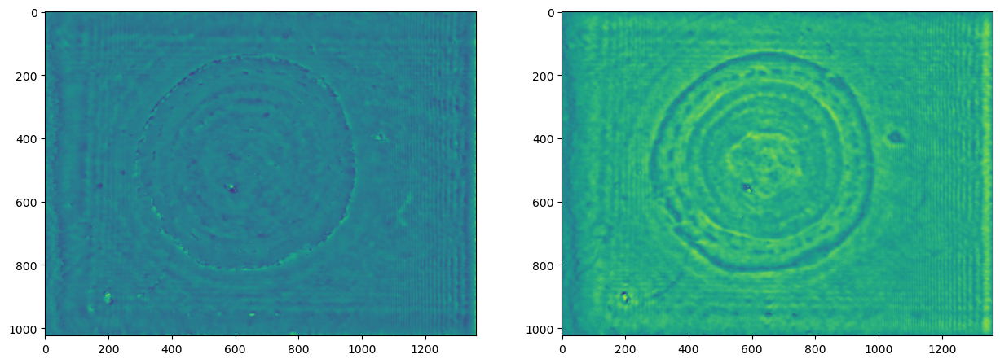

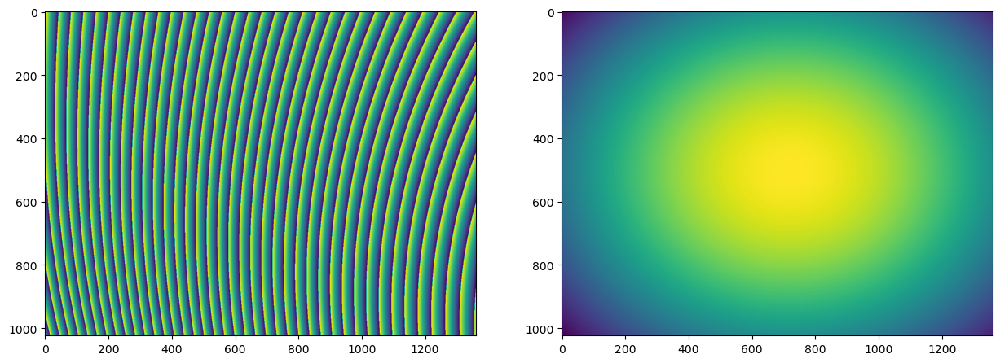

301 0.048281118878388714
302 0.04877959797906639
303 0.052897069924077944
304 0.0494719927088179
305 0.04826390993293281
306 0.05196912718679153
307 0.050201662838023346
308 0.049088950122277826
309 0.05123452901993818
310 0.04980619081192969
311 0.050002977783186804
312 0.050519210012751836
313 0.046900125325545314
314 0.050507592526271
315 0.04936847291088145
316 0.04679793154535814
317 0.04867183444286512
318 0.0499481263832154
319 0.05002090733742215
320 0.048855083235723296
321 0.046100927653200716
322 0.04655243244239012
323 0.05326006740078604
324 0.048025501022049166
325 0.04899376157701601
326 0.050505037159380796
327 0.04790116350898896
328 0.04826338507615769
329 0.04997388120331221
330 0.047517359688032515
331 0.04760892627761654
332 0.051149380276529766
333 0.04881409031836111
334 0.049341032489789556
335 0.05232320335953569
336 0.04946007546920368
337 0.04856723330844122
338 0.05169568725167248
339 0.05054017768091955
340 0.05852349421464418
341 0.0553527814792863
342 0.0

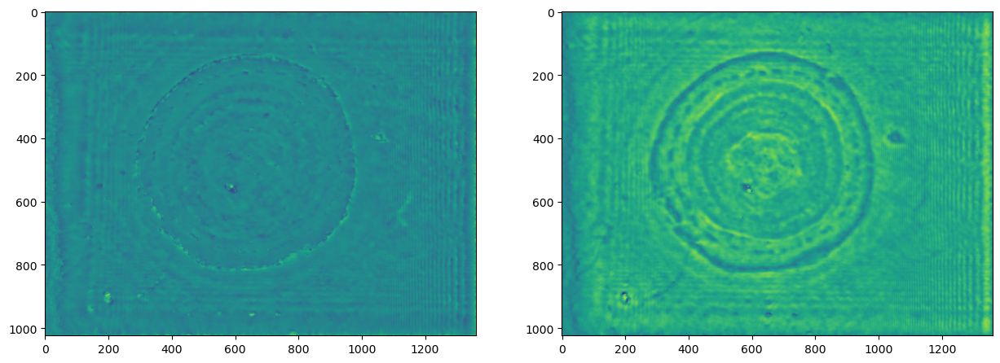

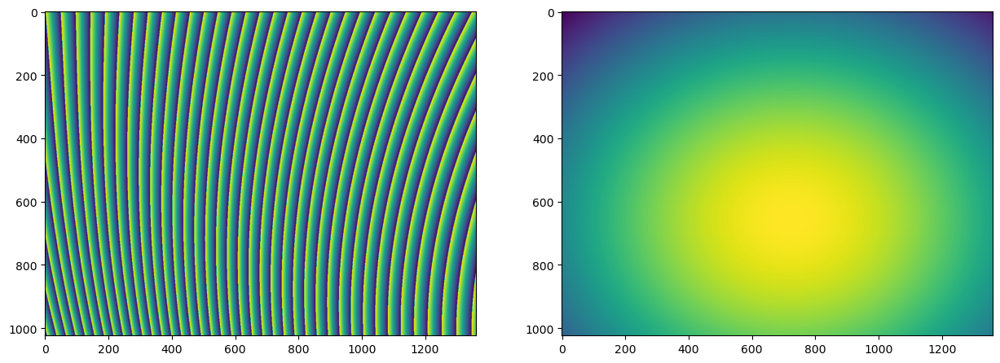

351 0.05359467561503853
352 0.05583475551089732
353 0.06267494783606638
354 0.05961757700380964
355 0.05981759092518925
356 0.05555986436625778
357 0.05946062857583874
358 0.0639250368316705
359 0.056481064331769984
360 0.05454884552431259
361 0.05633735172129571
362 0.053320792142206655
363 0.05504394269044388
364 0.05687673726106425
365 0.05689234686038094
366 0.054335682920736594
367 0.05250226146823986
368 0.051124616120353336
369 0.051322376842374846
370 0.052263887110094595
371 0.05229398515205821
372 0.05477483473461614
373 0.05345065066769704
374 0.051805325344354676
375 0.05011264021009677
376 0.05140564986837158
377 0.05080418943977692
378 0.05016063270694455
379 0.05056804940481088
380 0.048875273374168596
381 0.04795176393103828
382 0.050663507435373685
383 0.04731791431818418
384 0.047346016032256494
385 0.04943053729492974
386 0.046926199610298494
387 0.04604017074706818
388 0.05163990064493934
389 0.052631591349195476
390 0.04807231769960246
391 0.04595272767989465
392 0

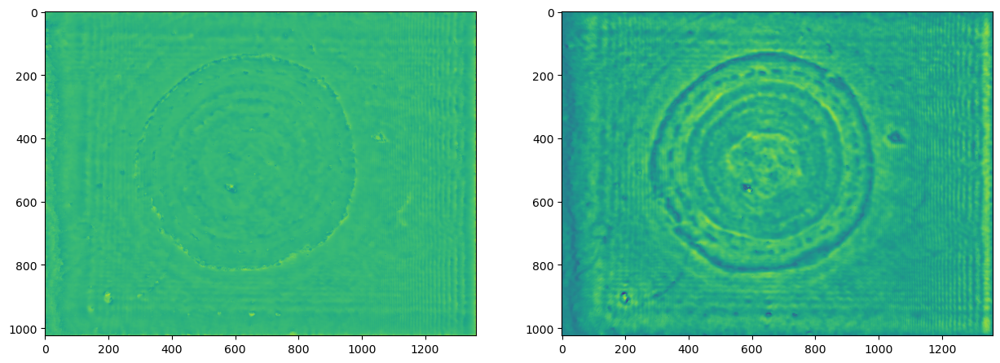

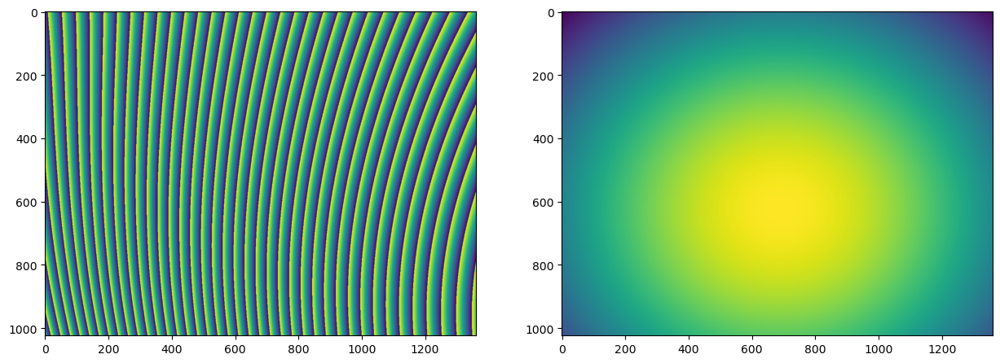

401 0.04564119994421632
402 0.045482737275496336
403 0.048210613485839986
404 0.047815566007859404
405 0.04478733139043996
406 0.04273086240443953
407 0.04216890290063632
408 0.042673296328684426
409 0.04445073655006307
410 0.04683497513163002
411 0.04774224251450026
412 0.04758767575421695
413 0.04456752695970691
414 0.04219970313193627
415 0.04165687399760485
416 0.042732568853497806
417 0.045248852924164265
418 0.046919921288845916
419 0.04326728309430059
420 0.04584975679292434
421 0.05033732655462307
422 0.04667028665047384
423 0.0484578036203667
424 0.05016738751534252
425 0.04936165058330895
426 0.05050567260256614
427 0.049443352978669634
428 0.05350555856794467
429 0.046718039091849746
430 0.051290239390527126
431 0.04839373593279613
432 0.047020372434506734
433 0.047193760046122024
434 0.04644259518685946
435 0.04694421776165116
436 0.04402247024689182
437 0.04464439010987867
438 0.04551796509469685
439 0.04371220715044656
440 0.04324842406892154
441 0.04845399567873304
442 0

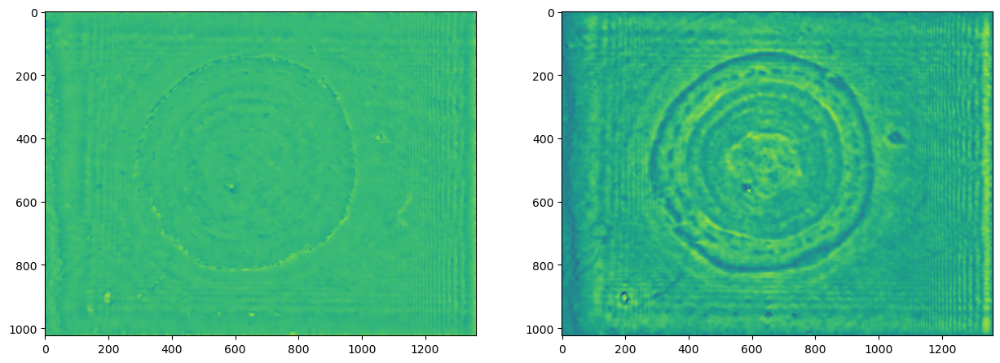

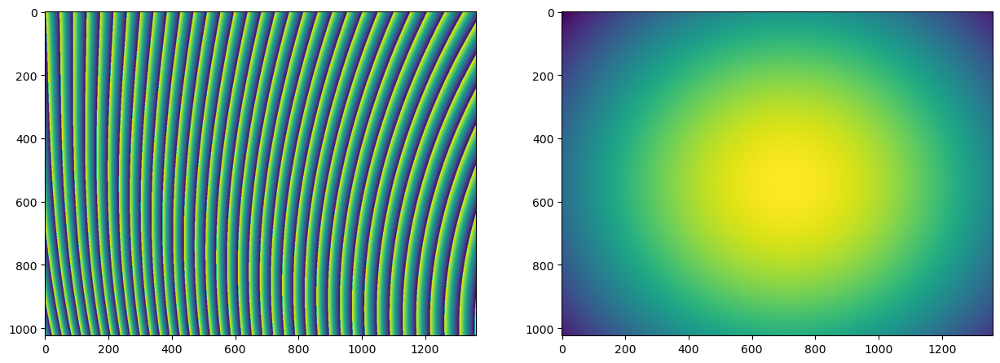

451 0.04425405369041701
452 0.04609922170704927
453 0.04793561981620366
454 0.04575685581849727
455 0.042360644194985024
456 0.04158825322938918
457 0.04277815701609051
458 0.04519539480712324
459 0.047117663474805054
460 0.045262608916048636
461 0.0413091089863823
462 0.04350050586956325
463 0.04539402882652674
464 0.044749559590532416
465 0.04404370727987038
466 0.04577724584585588
467 0.045223978376189654
468 0.046700238307083045
469 0.043692742988663665
470 0.04171119502864531
471 0.045483437172287956
472 0.04622510025369814
473 0.042532733395924914
474 0.04494515068429613
475 0.045753628949463186
476 0.04400188718300554
477 0.04581854751550801
478 0.044306824949522636
479 0.044850123904689884
480 0.04630406825733711
481 0.04630794151720434
482 0.045047828977861595
483 0.04186140472131662
484 0.042683585847489276
485 0.045350236974757735
486 0.045218609614188734
487 0.04421623870622497
488 0.04268810157868116
489 0.04293744282264506
490 0.043779510961515236
491 0.0448824892298575
4

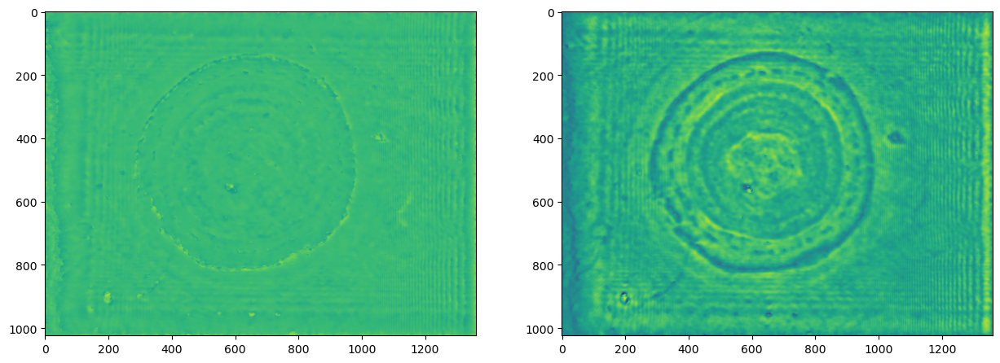

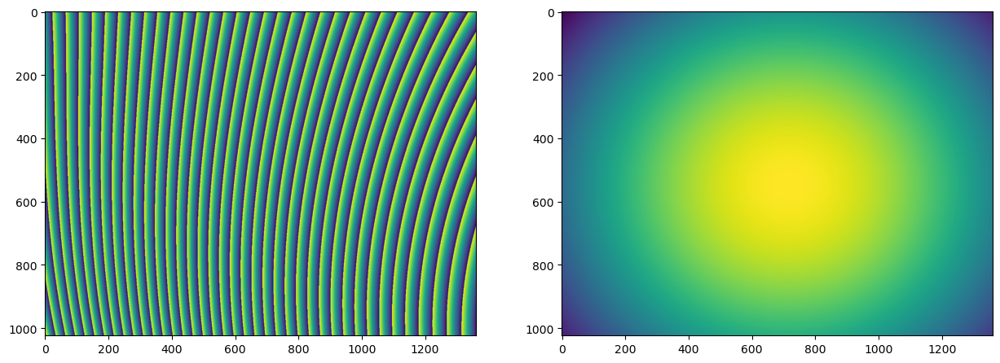

In [34]:
epochs = 501

loss_arr = []
loss_amp_arr = []
loss_phase_arr = []

wave_amp_coeff_train = []
wave_phase_coeff_train = []

for itr in range(epochs):

    optimizer.zero_grad()
    # optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)

    wave_amp = wave_amp_coef[0]*gaus2d(torch.tensor(X), torch.tensor(Y), wave_amp_coef[1], wave_amp_coef[2], wave_amp_coef[3], wave_amp_coef[4]).T
    wave = wave_amp*torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)
    wave_z = torch.angle(wave_at_img)
    wave_z += cons
    loss_phase = loss_fn(wave_z, target_phase)
    loss_amp = loss_fn(torch.abs(wave_at_img), target_abs)

    loss = 0.5*(loss_amp + loss_phase) 
    # + 0.5*(total_variation_loss(wave_z, 0.1) + total_variation_loss(torch.abs(wave_at_img), 0.1))

    # proc = model(obj_phase.unsqueeze(0).unsqueeze(0)).squeeze()
    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    loss_amp_arr.append(loss_amp.item())
    loss_phase_arr.append(loss_phase.item())

    wave_amp_coeff_train.append(wave_amp_coef.detach().clone())
    # print(wave_amp_coef.detach())
    wave_phase_coeff_train.append(coeffs.detach().clone())

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[0].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.detach())
        plt.show()

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[0].imshow(torch.angle(wave.detach()))
        # axs[1].imshow(proc.detach())
        axs[1].imshow(torch.abs(wave.detach()))
        plt.show()
        

In [35]:
# wave_amp.shape, wave_amp_coef, wave_amp_coef.grad

In [36]:
# dist, cons.grad, coeffs.grad, coeffs

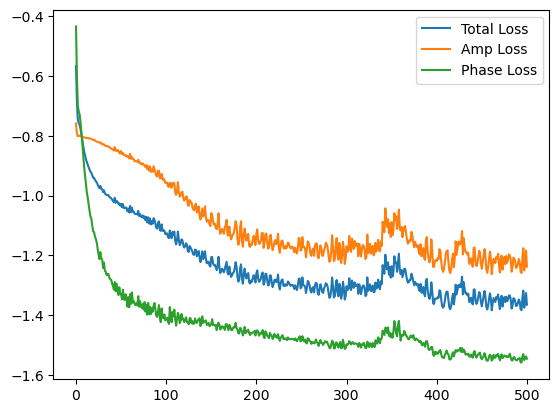

In [37]:
plt.plot(np.log10(loss_arr), label='Total Loss')
plt.plot(np.log10(loss_amp_arr), label='Amp Loss')
plt.plot(np.log10(loss_phase_arr), label='Phase Loss')

plt.legend()

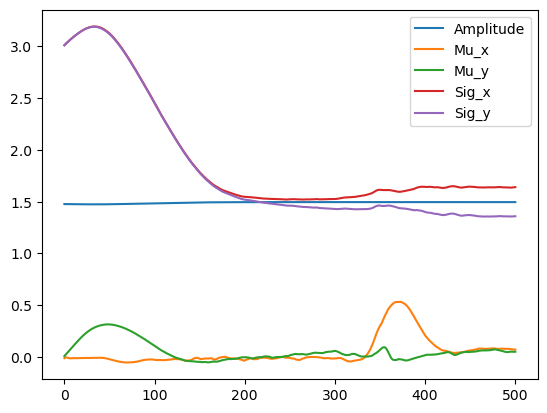

In [40]:
plt.plot(torch.log10(torch.stack(wave_amp_coeff_train)[:, 0]), label='Amplitude')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 1], label='Mu_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 2], label='Mu_y')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 3], label='Sig_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 4], label='Sig_y')
plt.legend()

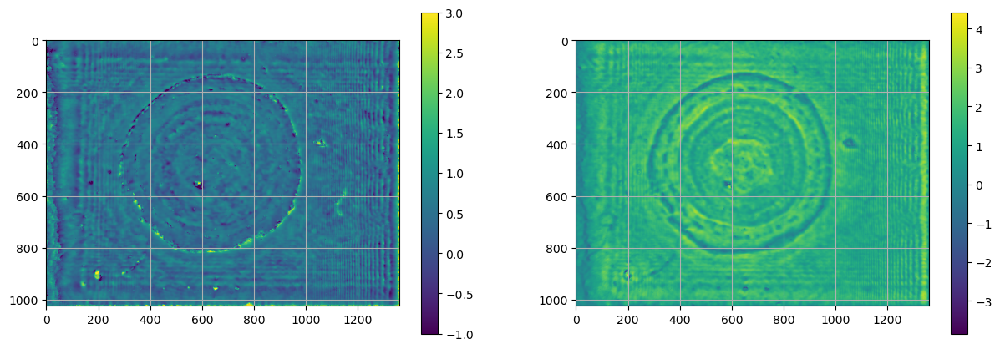

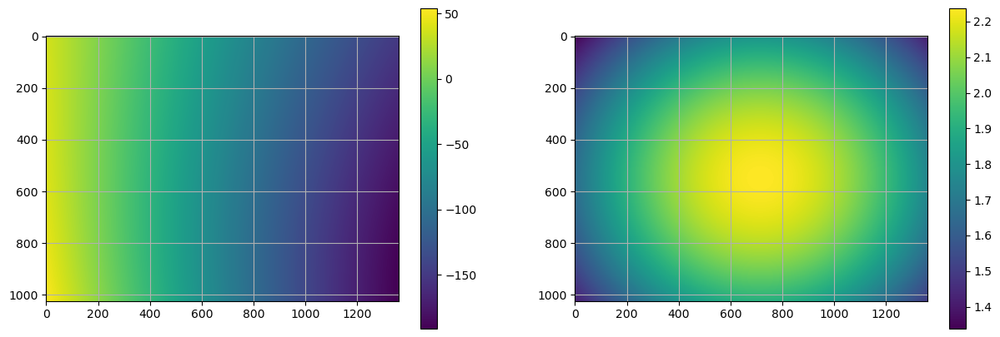

In [41]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()


fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(wave_amp.detach())
cm0 = axs[0].imshow(wave_phase.detach())
# , vmin=-30, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

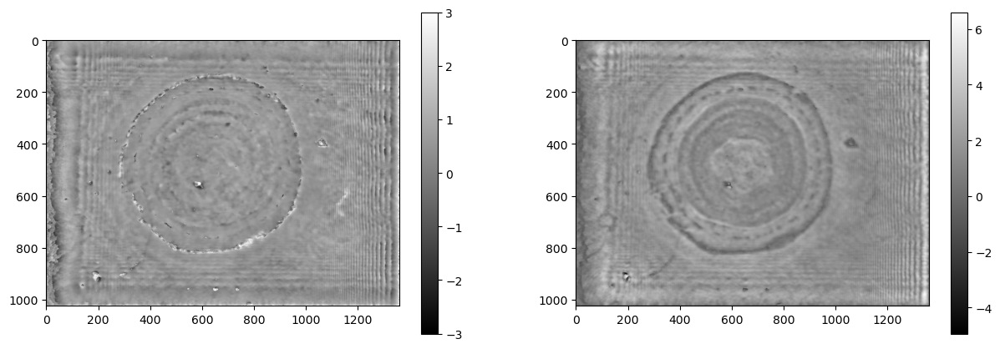

In [93]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach(), cmap='gray')
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-3, vmax=3, cmap='gray')

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

# axs[0].grid()
# axs[1].grid()

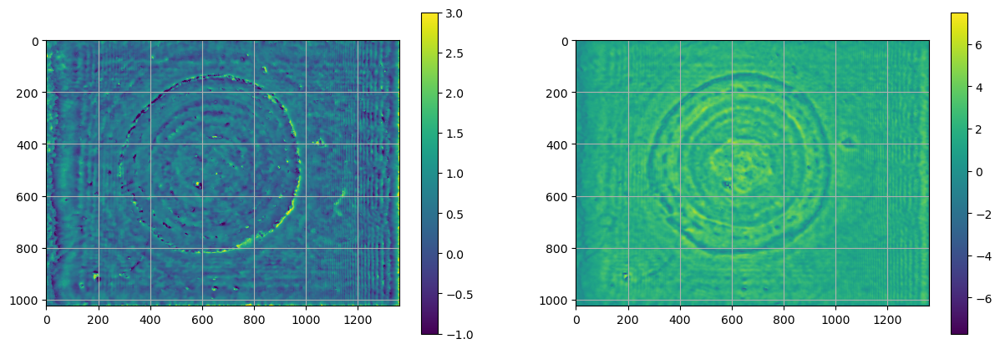

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

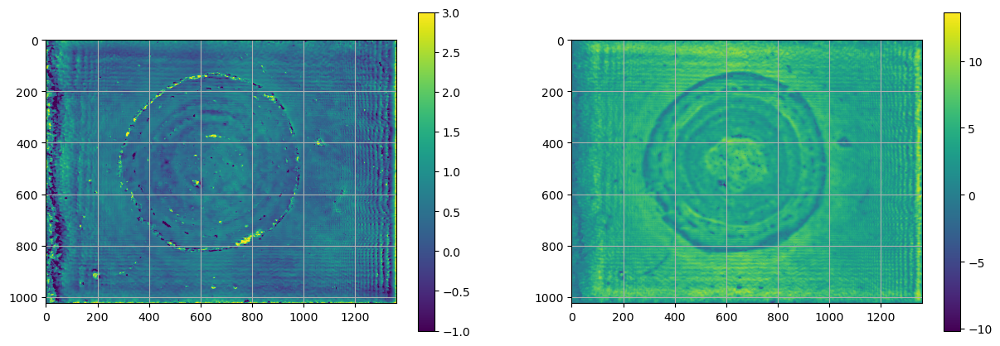

In [180]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

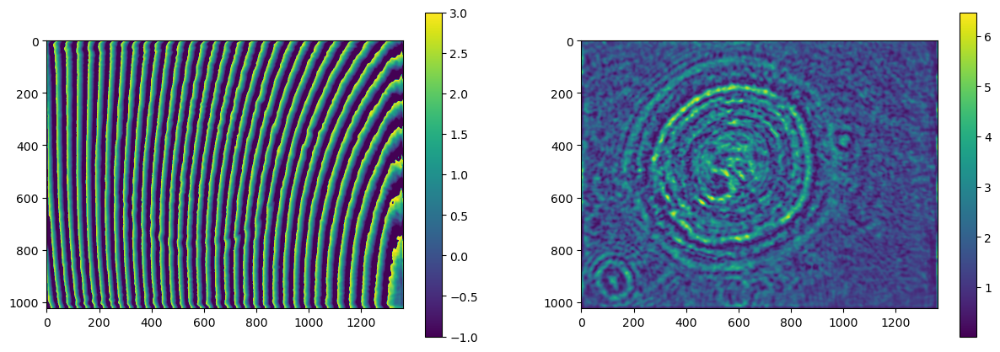

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

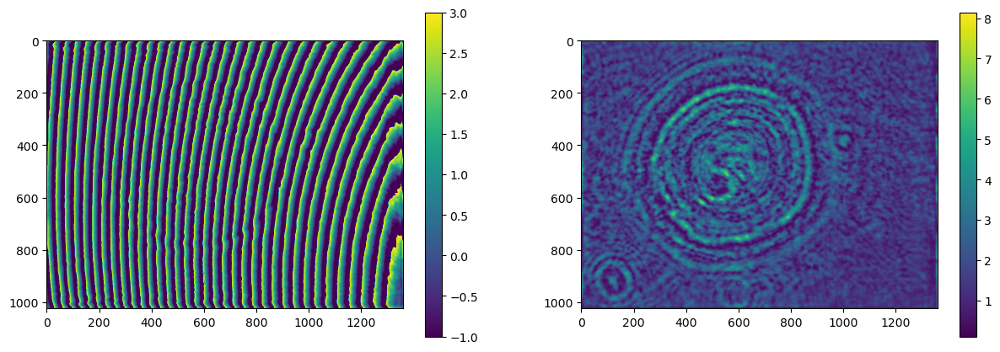

In [21]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

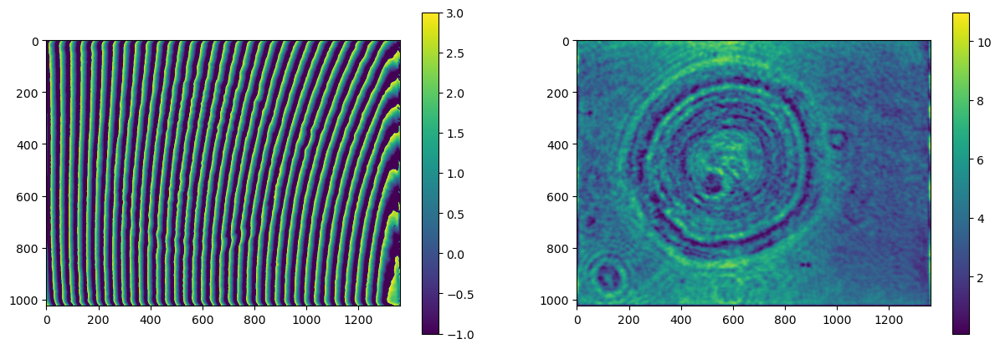

In [178]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

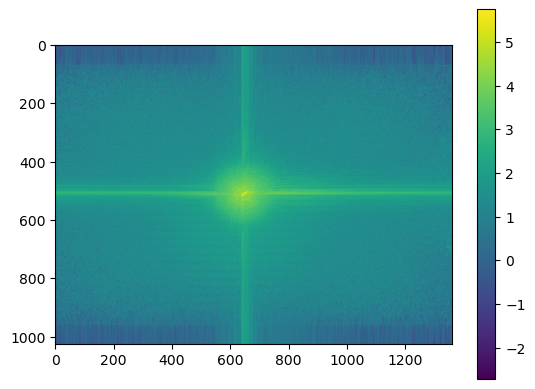

In [22]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

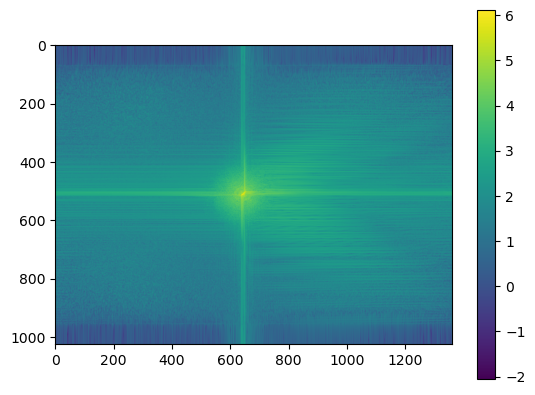

In [172]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

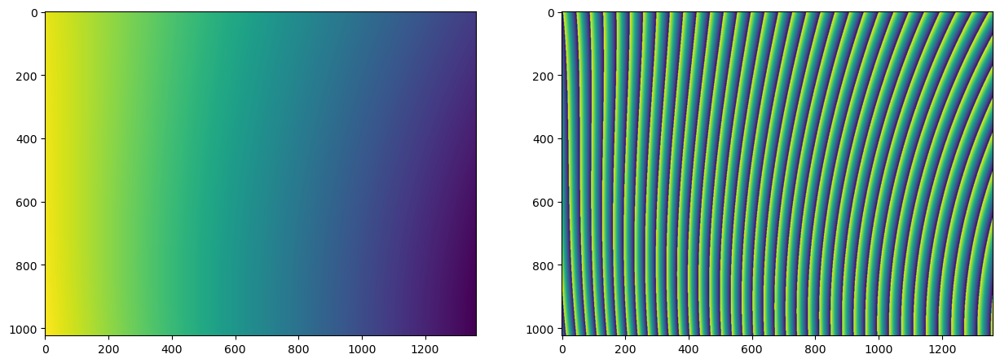

In [173]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

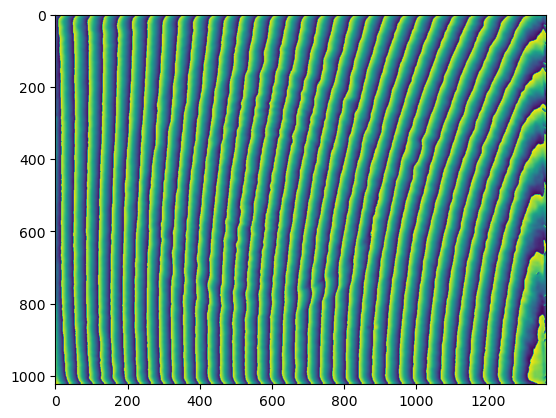

In [174]:
plt.imshow(wave_z.detach().T)

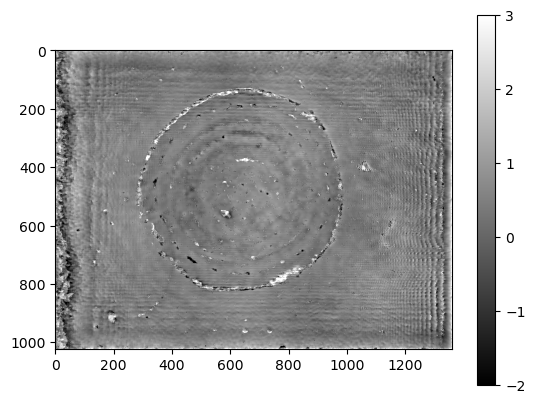

In [175]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()